<a href="https://colab.research.google.com/github/midgebar/547ualb/blob/main/PlayerPiano.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Reading Punchcards and Player Piano Rolls
After going through the [UMD Reading Punchcards Jupyter Notebook](https://https://github.com/cases-umd/Reading-Punchcards.git), I decided to utilize it for reading player piano rolls.

I also utilized [Zulko's February 2014 blog post](https://zulko.github.io/blog/2014/02/12/transcribing-piano-rolls/) titled, *Transcribing Piano Rolls, the Pythonic Way* , to help me understand how the code can be configured.

There are some key differences that I needed to keep in mind and adjust:


*   Strictly vertical reading format
  * Piano rolls are only read vertically, I have to figure out if horizontal analysis is necessary.
*  Zulko's project utilized a specific line of pixels from video snapshots to time, scan and analyze the extract sound for MIDI files as an output.


#Piano Player Rolls

Public domain, obtained from SUPRA, the Stanford University Piano Roll

<img src="https://u.cubeupload.com/justasmeadge/e58Screenshot20250501at.png" alt="Screenshot of full Piano Player Roll Scan" title="ChopinFullScan" height="500">

---


SUPRA, *Preludes. No. 3, G major ; No. 6, B minor. (n.d.). Stanford University Piano Roll Archive - Spotlight Exhibits. https://exhibits.stanford.edu/supra/catalog/sn610pr8684*

# Loading the Images into Python

1. `image = Image.open("/image/path/here")`:

  Printing Original Dimensions: This helps you understand the initial orientation and size of your image.
Rotation Logic:
2. Commented Out Rotation:
  Change in the rotation line `(image = image.rotate(-90, expand=True))`.
3. Vertical Reading Assumption:
  Based on the visual of a piano roll, the vertical direction usually represents the progression of time, and the horizontal direction represents the pitch. If the image scan aligns with this, it might not need rotation.

4. If Rotation is Needed:
  If the "time" axis (the direction along the length of the piano roll) is horizontal in your scan, then uncomment the rotation line. The -90 will rotate it 90 degrees clockwise. Adjust the angle (e.g., 90 for counter-clockwise) if needed. expand=True ensures that the rotated image fits entirely within the new dimensions.

5. Printing Processed Dimensions:
  This shows the dimensions after the potential rotation, which will be crucial for subsequent calculations.

6. Display:
  This displays the image after loading and potential rotation, allowing you to visually confirm its orientation.

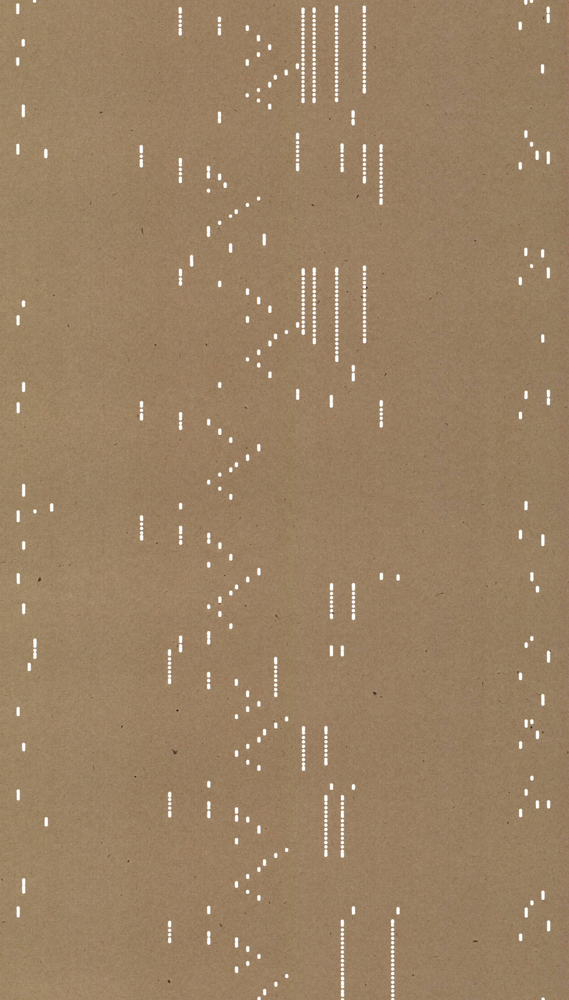

In [18]:
# Loading the Data
from PIL import Image

# Read the image file into an Image object:
image = Image.open("/content/sample_data/chopin2.png")
display(image)  # We use the IPython display function to show the image.


RED = (255, 0, 0)
BLUE = (0, 0, 255)
def debug(image, rectangle, color):
    debug = image.copy()
    debug = debug.convert(mode="RGB")
    draw = ImageDraw.Draw(debug)
    for i in range(-2,2):
        shifted = list(map(lambda x: x + i, rectangle))
        draw.rectangle(shifted, outline=color)
    return debug

from PIL import ImageStat, ImageDraw
def brightness( im ):
    stat = ImageStat.Stat(im)
    return stat.mean[0]

# Determine if card surface is darker than the background
def isbacklit(image):
    # is the center lighter or darker than the edges..
    # pick a center square and avg brightness
    width, height = image.size
    ctr_box = (width/4, height/4, (width/4)*3, (height/4)*3)
    ctr_region = image.crop(ctr_box)
    # pick square left edge to center square and avg brightness.
    left_box = (0, height/4, width/4, (height/4)*3)
    show = debug(image, ctr_box, RED)
    show = debug(show, left_box, BLUE)
    display(show)
    left_region = image.crop(left_box)
    left_brightness = brightness(left_region)
    center_brightness = brightness(ctr_region)
    return left_brightness > center_brightness

# Resizing the Image
After running some of my code, I noticed that the image was very high quality but was far too large to effectively visualize it.

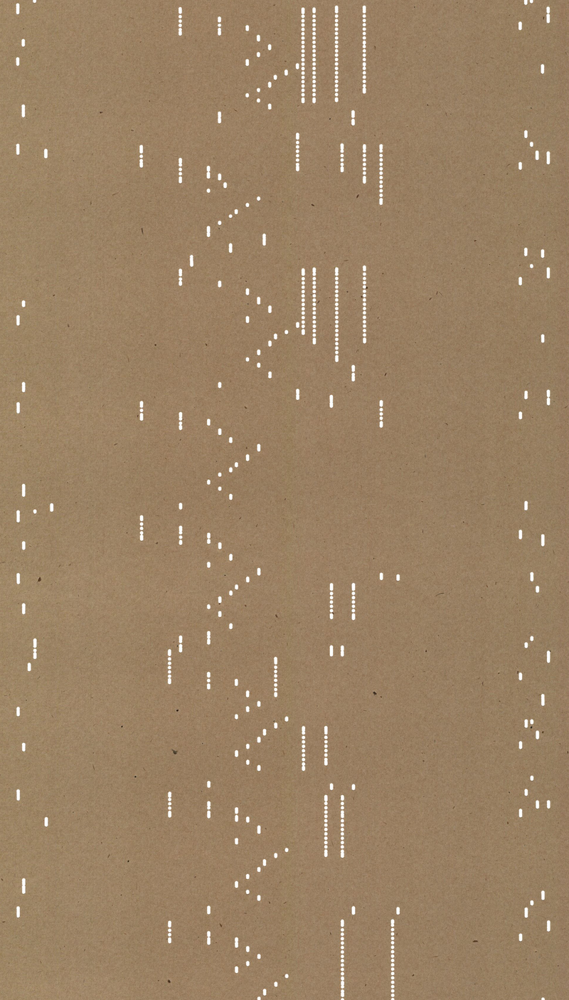

In [19]:
# Loading the Data
from PIL import Image

# Read the image file into an Image object:
image = Image.open("/content/sample_data/chopin2.png")

# Resize the image
new_width = 800  # You can adjust this as needed
new_height = int(image.height * (new_width / image.width))  # Maintain aspect ratio
resized_image = image.resize((new_width, new_height), Image.LANCZOS)  # Use a high-quality resampling filter

# Invert the resized image
inverted_image = Image.new("L", resized_image.size)  # Create a new grayscale image
for x in range(resized_image.width):
    for y in range(resized_image.height):
        pixel_value = resized_image.getpixel((x, y))
        if isinstance(pixel_value, tuple):
            inverted_pixel_value = 255 - pixel_value[0]  # Invert the red component (assuming grayscale)
        else:
            inverted_pixel_value = 255 - pixel_value  # Invert the pixel value
        inverted_image.putpixel((x, y), inverted_pixel_value)

RED = (255, 0, 0)
BLUE = (0, 0, 255)
def debug(image, rectangle, color):
    debug = image.copy()
    debug = debug.convert(mode="RGB")
    draw = ImageDraw.Draw(debug)
    for i in range(-2,2):
        shifted = list(map(lambda x: x + i, rectangle))
        draw.rectangle(shifted, outline=color)
    return debug

from PIL import ImageStat, ImageDraw
def brightness( im ):
    stat = ImageStat.Stat(im)
    return stat.mean[0]

# Determine if card surface is darker than the background
def isbacklit(image):
    # is the center lighter or darker than the edges..
    width, height = image.size
    ctr_box = (width/4, height/4, (width/4)*3, (height/4)*3)
    ctr_region = image.crop(ctr_box)
    left_box = (0, height/4, width/4, (height/4)*3)
    show = debug(image, ctr_box, RED)
    show = debug(show, left_box, BLUE)
    display(show)
    left_region = image.crop(left_box)
    left_brightness = brightness(left_region)
    center_brightness = brightness(ctr_region)
    return left_brightness > center_brightness

display(resized_image)

# Image Preparation

Greyscale, Backlighting, Inversion

xplanation:

We load the image using Image.open().
We convert it to grayscale using image.convert("L").
The manual_threshold function iterates through each pixel of the grayscale image.

If the pixel's intensity is less than the threshold_value, it's set to black (0); otherwise, it's set to white (255).
We call the function and display the resulting binary image.


Important Notes:

Experiment with threshold_value: The optimal threshold value will depend on the specific lighting conditions and contrast in your image. You'll likely need to try different values (e.g., 100, 150, 200) to see which one best separates the holes from the background.

Consider Adaptive Thresholding: If the background lighting varies significantly across the image, a single global threshold might not work well. In that case, you might need to explore adaptive thresholding techniques (which calculate a local threshold for different regions of the image).

Libraries like OpenCV provide functions for adaptive thresholding. If you want to go this route, let me know, and I can provide an example.

Libraries: This example uses PIL, which is included in most Python installations. If you decide to use OpenCV for more advanced thresholding, you'll need to install it (pip install opencv-python).

This next step will give you a much cleaner image to work with for hole detection! Let me know how it goes, and if you have any questions as you experiment with the threshold value.

# Greyscale

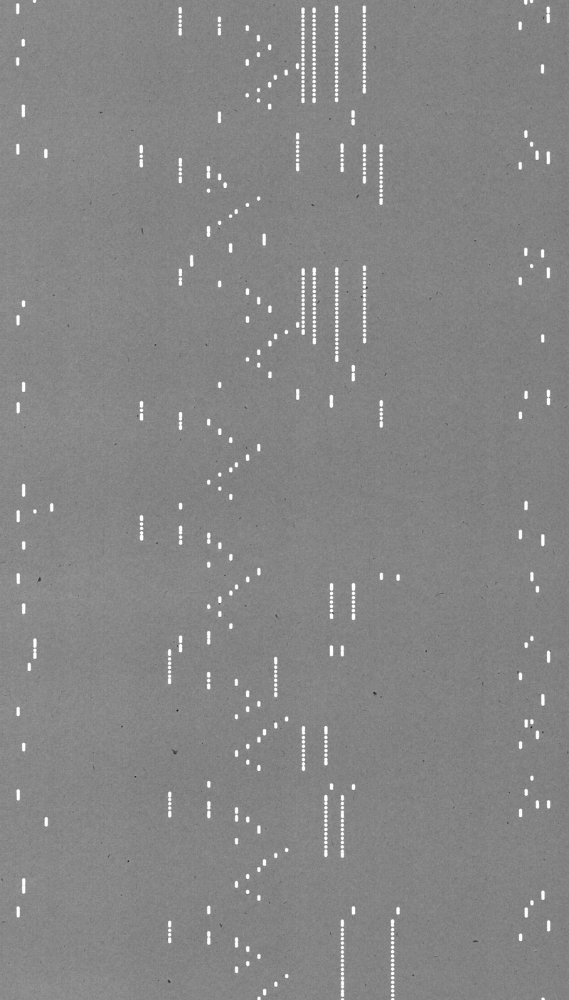

In [20]:
# Loading the Data
from PIL import Image

# Read the image file into an Image object:
image = Image.open("/content/sample_data/chopin2.png")

# Convert to grayscale BEFORE resizing
grayscale_image = image.convert("L")

# Resize the grayscale image
new_width = 800  # You can adjust this as needed
new_height = int(grayscale_image.height * (new_width / grayscale_image.width))  # Maintain aspect ratio
resized_image = grayscale_image.resize((new_width, new_height), Image.LANCZOS)  # Use a high-quality resampling filter

# Invert the resized grayscale image
inverted_image = Image.new("L", resized_image.size)  # Create a new grayscale image
for x in range(resized_image.width):
    for y in range(resized_image.height):
        pixel_value = resized_image.getpixel((x, y))
        inverted_pixel_value = 255 - pixel_value  # Invert the pixel value (now an int)
        inverted_image.putpixel((x, y), inverted_pixel_value)

display(resized_image)  # Display the resized grayscale image

# Checking if Backlit

backlit: False


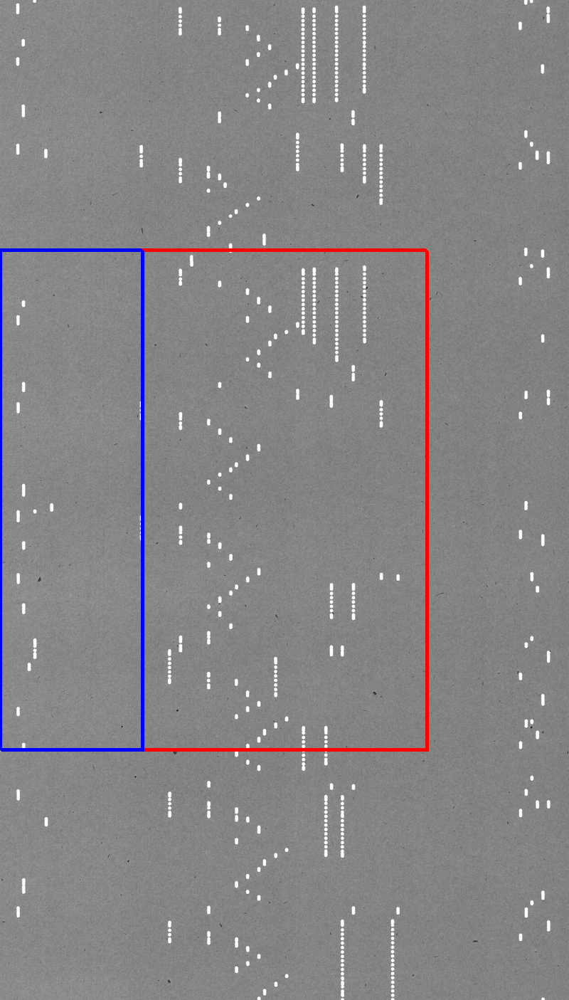

backlit: False


In [22]:
from PIL import Image, ImageStat, ImageDraw

def brightness(im):
    stat = ImageStat.Stat(im)
    return stat.mean[0]

# Determine if card surface is darker than the background
def isbacklit_check(image):
    # is the center lighter or darker than the edges..
    width, height = image.size
    # Define the center square
    ctr_box = (width // 4, height // 4, width * 3 // 4, height * 3 // 4)
    ctr_region = image.crop(ctr_box)
    center_brightness = brightness(ctr_region)

    # Define the left edge square
    left_box = (0, height // 4, width // 4, height * 3 // 4)
    left_region = image.crop(left_box)
    left_brightness = brightness(left_region)

    # Consider the image backlit if the center is significantly brighter than the left edge
    threshold_difference = 10  # Adjust this threshold as needed
    return center_brightness > left_brightness + threshold_difference

# Loading the Data
from PIL import Image

# Read the image file into an Image object:
image_path = "/content/sample_data/chopin2.png"
image = Image.open(image_path)

# Convert to grayscale BEFORE resizing
grayscale_image = image.convert("L")

# Resize the grayscale image
new_width = 800  # You can adjust this as needed
new_height = int(grayscale_image.height * (new_width / grayscale_image.width))  # Maintain aspect ratio
resized_image = grayscale_image.resize((new_width, new_height), Image.LANCZOS)  # Use a high-quality resampling filter

# Invert the resized grayscale image
inverted_image = Image.new("L", resized_image.size)  # Create a new grayscale image
for x in range(resized_image.width):
    for y in range(resized_image.height):
        pixel_value = resized_image.getpixel((x, y))
        inverted_pixel_value = 255 - pixel_value  # Invert the pixel value (now an int)
        inverted_image.putpixel((x, y), inverted_pixel_value)

# Check if the *resized* grayscale image is backlit
backlit = isbacklit_check(resized_image)
print("backlit: {}".format(backlit))

# Visualizer (Resized Inverted Grayscale Image with Region Highlighting)
RED = (255, 0, 0)
BLUE = (0, 0, 255)

def debug(image, rectangle, color):
    debug_image = image.copy().convert("RGB")  # Ensure it's RGB for color outlines
    draw = ImageDraw.Draw(debug_image)
    for i in range(-2, 3):  # Adjust range for better visibility
        shifted = (rectangle[0] + i, rectangle[1] + i, rectangle[2] + i, rectangle[3] + i)
        draw.rectangle(shifted, outline=color)
    return debug_image

# Calculate the rectangles based on the resized image dimensions
width, height = resized_image.size
ctr_box = (width // 4, height // 4, width * 3 // 4, height * 3 // 4)
left_box = (0, height // 4, width // 4, height * 3 // 4)

debug_image = debug(resized_image, ctr_box, RED)
debug_image = debug(debug_image, left_box, BLUE)
display(debug_image)
print("backlit: {}".format(backlit))

# Cropping Image
I uploaded cropped images with no border, so this step was unnecessary for me.

# Binarization and Note Detection

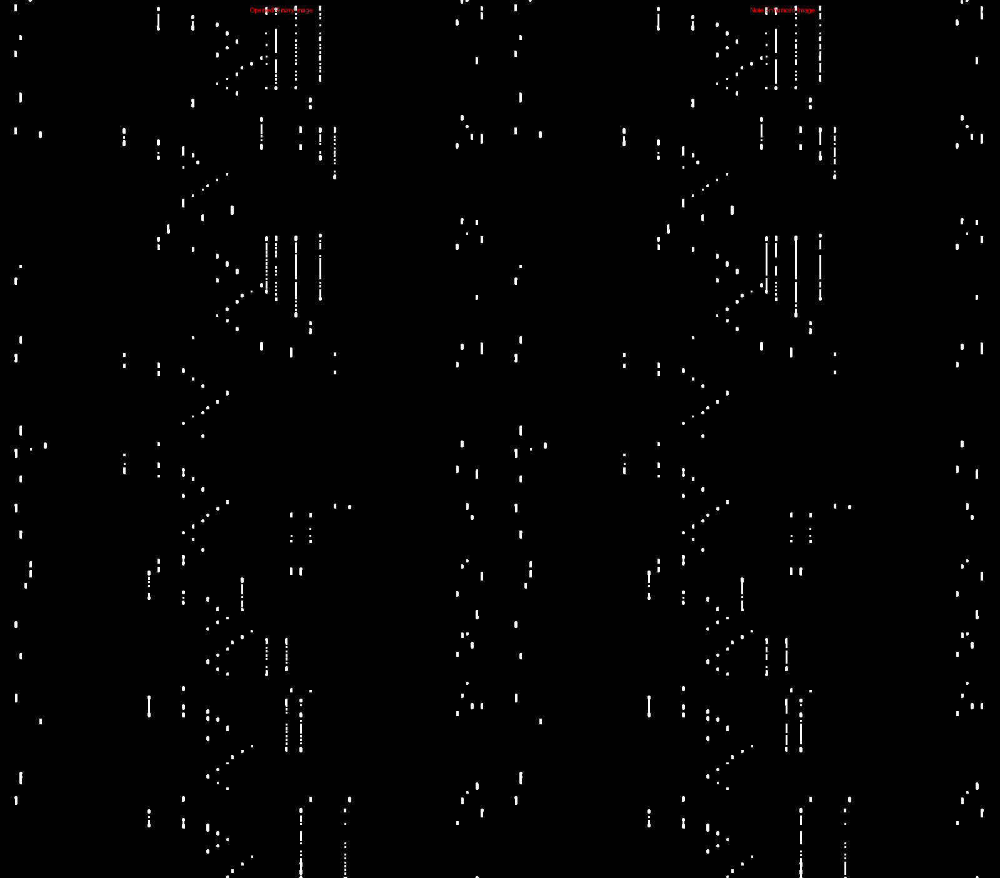

In [27]:
from PIL import Image, ImageStat, ImageDraw, ImageFilter, ImageEnhance

def brightness(im):
    stat = ImageStat.Stat(im)
    return stat.mean[0]

def isbacklit_check(image):
    width, height = image.size
    ctr_box = (width // 4, height // 4, width * 3 // 4, height * 3 // 4)
    ctr_region = image.crop(ctr_box)
    center_brightness = brightness(ctr_region)
    left_box = (0, height // 4, width // 4, height * 3 // 4)
    left_region = image.crop(left_box)
    left_brightness = brightness(left_region)
    threshold_difference = 10
    return center_brightness > left_brightness + threshold_difference

# --- Helper Functions for Morphology (Basic) ---
def dilate(image):
    dilated = image.copy()
    for x in range(1, image.width - 1):
        for y in range(1, image.height - 1):
            max_neighbor = max(
                image.getpixel((x-1, y-1)), image.getpixel((x, y-1)), image.getpixel((x+1, y-1)),
                image.getpixel((x-1, y  )), image.getpixel((x, y  )), image.getpixel((x+1, y  )),
                image.getpixel((x-1, y+1)), image.getpixel((x, y+1)), image.getpixel((x+1, y+1))
            )
            dilated.putpixel((x, y), max_neighbor)
    return dilated

def erode(image):
    eroded = image.copy()
    for x in range(1, image.width - 1):
        for y in range(1, image.height - 1):
            min_neighbor = min(
                image.getpixel((x-1, y-1)), image.getpixel((x, y-1)), image.getpixel((x+1, y-1)),
                image.getpixel((x-1, y  )), image.getpixel((x, y  )), image.getpixel((x+1, y  )),
                image.getpixel((x-1, y+1)), image.getpixel((x, y+1)), image.getpixel((x+1, y+1))
            )
            eroded.putpixel((x, y), min_neighbor)
    return eroded

def open_image(image, iterations=1):
    opened = image.copy()
    for _ in range(iterations):
        opened = erode(opened)
        opened = dilate(opened)
    return opened

def enhance_notes(image, iterations=2):
    enhanced = image.copy()
    for _ in range(iterations):
        enhanced = dilate(enhanced)
        enhanced = erode(enhanced)
    return enhanced

def adaptive_threshold(image, block_size, c):
    """
    Applies adaptive thresholding to a grayscale image.

    Args:
        image (PIL.Image): The grayscale image to binarize.
        block_size (int): Size of the pixel neighborhood used for thresholding.
                          Must be an odd number.
        c (int): Constant subtracted from the mean or weighted mean.

    Returns:
        PIL.Image: The binarized image.
    """

    binary = image.copy()
    width, height = image.size

    for y in range(height):
        for x in range(width):
            # Calculate local neighborhood bounds
            x1 = max(0, x - block_size // 2)
            y1 = max(0, y - block_size // 2)
            x2 = min(width - 1, x + block_size // 2)
            y2 = min(height - 1, y + block_size // 2)

            # Extract the local neighborhood
            neighborhood = [image.getpixel((i, j)) for j in range(y1, y2 + 1) for i in range(x1, x2 + 1)]

            # Calculate the mean of the neighborhood
            mean = sum(neighborhood) / len(neighborhood)

            # Determine the threshold
            threshold = mean - c

            # Apply the threshold
            if image.getpixel((x, y)) < threshold:
                binary.putpixel((x, y), 0)  # Black
            else:
                binary.putpixel((x, y), 255)  # White

    return binary

# --- Loading and Processing ---
image_path = "/content/sample_data/chopin2.png"
image = Image.open(image_path)
grayscale_image = image.convert("L")

process_width = 800
process_height = int(grayscale_image.height * (process_width / grayscale_image.width))
resized_grayscale = grayscale_image.resize((process_width, process_height), Image.LANCZOS)

# 1. Stronger Noise Reduction
median_filtered = resized_grayscale.filter(ImageFilter.MedianFilter(size=5))

# 2. Binarization
binary_image = adaptive_threshold(median_filtered, block_size=7, c=-10)

# 3. Noise Removal (Opening)
opened_image = open_image(binary_image, iterations=2)

# 4. Note Enhancement (Closing)
enhanced_note_image = enhance_notes(opened_image, iterations=2)

# --- Visualizer ---
enhanced_binary_vis = opened_image.copy()
enhancer = ImageEnhance.Contrast(enhanced_binary_vis)
enhanced_binary_vis = enhancer.enhance(2.0)

combined_image = Image.new("RGB", (binary_image.width * 2, binary_image.height))
combined_image.paste(enhanced_binary_vis.convert("RGB"), (0, 0))
combined_image.paste(enhanced_note_image.convert("RGB"), (binary_image.width, 0))

draw = ImageDraw.Draw(combined_image)
draw.text((binary_image.width // 2, 10), "Opened Binary Image", fill=(255, 0, 0))
draw.text((binary_image.width + binary_image.width // 2, 10), "Note Enhanced Image", fill=(255, 0, 0))

display(combined_image)

# Data Extraction

In [31]:
from PIL import Image, ImageStat, ImageDraw, ImageFilter, ImageEnhance

def brightness(im):
    stat = ImageStat.Stat(im)
    return stat.mean[0]

def isbacklit_check(image):
    width, height = image.size
    ctr_box = (width // 4, height // 4, width * 3 // 4, height * 3 // 4)
    ctr_region = image.crop(ctr_box)
    center_brightness = brightness(ctr_region)
    left_box = (0, height // 4, width // 4, height * 3 // 4)
    left_region = image.crop(left_box)
    left_brightness = brightness(left_region)
    threshold_difference = 10
    return center_brightness > left_brightness + threshold_difference

# --- Helper Functions for Morphology (Basic) ---
def dilate(image):
    dilated = image.copy()
    for x in range(1, image.width - 1):
        for y in range(1, image.height - 1):
            max_neighbor = max(
                image.getpixel((x-1, y-1)), image.getpixel((x, y-1)), image.getpixel((x+1, y-1)),
                image.getpixel((x-1, y  )), image.getpixel((x, y  )), image.getpixel((x+1, y  )),
                image.getpixel((x-1, y+1)), image.getpixel((x, y+1)), image.getpixel((x+1, y+1))
            )
            dilated.putpixel((x, y), max_neighbor)
    return dilated

def erode(image):
    eroded = image.copy()
    for x in range(1, image.width - 1):
        for y in range(1, image.height - 1):
            min_neighbor = min(
                image.getpixel((x-1, y-1)), image.getpixel((x, y-1)), image.getpixel((x+1, y-1)),
                image.getpixel((x-1, y  )), image.getpixel((x, y  )), image.getpixel((x+1, y  )),
                image.getpixel((x-1, y+1)), image.getpixel((x, y+1)), image.getpixel((x+1, y+1))
            )
            eroded.putpixel((x, y), min_neighbor)
    return eroded

def open_image(image, iterations=1):
    opened = image.copy()
    for _ in range(iterations):
        opened = erode(opened)
        opened = dilate(opened)
    return opened

def enhance_notes(image, iterations=2):
    enhanced = image.copy()
    for _ in range(iterations):
        enhanced = dilate(enhanced)
        enhanced = erode(enhanced)
    return enhanced

# --- Loading and Processing ---
image_path = "/content/sample_data/chopin2.png"
image = Image.open(image_path)
grayscale_image = image.convert("L")

process_width = 800
process_height = int(grayscale_image.height * (process_width / grayscale_image.width))
resized_grayscale = grayscale_image.resize((process_width, process_height), Image.LANCZOS)

# 1. Stronger Noise Reduction
median_filtered = resized_grayscale.filter(ImageFilter.MedianFilter(size=5))

# 2. Binarization
binary_image = adaptive_threshold(median_filtered, block_size=7, c=-10)

# 3. Noise Removal (Opening)
opened_image = open_image(binary_image, iterations=3)

# 4. Note Enhancement (Closing)
enhanced_note_image = enhance_notes(opened_image, iterations=2)

# --- Data Extraction / Analyzing Vertical Lines of Notes ---
def detect_notes(image, num_pitches):
    """Detects notes in the image and organizes them by pitch."""

    notes_by_pitch = [[] for _ in range(num_pitches)]  # Initialize list of lists
    width, height = image.size
    pitch_width = width / num_pitches  # Width of each pitch column (approx)

    for pitch in range(num_pitches):
        left = int(pitch * pitch_width)
        right = int((pitch + 1) * pitch_width)
        start_row = None
        for row in range(height):
            note_detected = False
            for col in range(left, right):  # Check within the pitch column
                if image.getpixel((col, row)) == 255:
                    note_detected = True
                    break
            if note_detected and start_row is None:
                start_row = row
            elif not note_detected and start_row is not None:
                end_row = row
                duration = end_row - start_row
                notes_by_pitch[pitch].append({'onset': start_row, 'duration': duration})
                start_row = None
        if start_row is not None:  # Note extends to the bottom
            notes_by_pitch[pitch].append({'onset': start_row, 'duration': height - start_row})
    return notes_by_pitch

num_pitches = 88  # Standard piano
notes_by_pitch = detect_notes(enhanced_note_image, num_pitches)

# --- Visualizer ---
def visualize_notes_text(notes_by_pitch, num_rows, num_pitches):
    """Creates a text-based visualization of the notes."""

    visualization = ""
    for row in range(num_rows):
        line = ""
        for pitch in range(num_pitches):
            note_symbol = "."  # Default: no note
            for note in notes_by_pitch[pitch]:
                if note['onset'] == row:
                    note_symbol = "|"  # Note onset
                elif row > note['onset'] and row < note['onset'] + note['duration']:
                    note_symbol = "-"  # Note sustain
            line += note_symbol
        visualization += line + "\n"
    return visualization

num_rows = enhanced_note_image.height
text_visualization = visualize_notes_text(notes_by_pitch, num_rows, num_pitches)
print(text_visualization)

.....|...........................................................................||.....
.....-...........................................................................--.....
.....-...........................................................................--.....
.................................................................................-......
.................................................................................-......
.................................................................................-......
........................................................................................
..|.....................................................................................
..-.....................................................................................
..-.................................................|...|...............................
..-................................................|-...-...........................|...
..-..................

# Result 1
Strengths of the Current Text-Based Output:

Direct Representation: It directly reflects the binary state of each pitch column over time. A "|" clearly indicates the start of a note, and "-" shows it continues.
Simplicity: It's a relatively straightforward way to visualize the temporal sequence of notes for each pitch.
Debug and Inspection: It's useful for debugging your note detection algorithm and visually inspecting the results. You can quickly see if notes are being detected at the right times and for the correct durations.
Accessibility (to technical users): For someone familiar with this representation, it can convey the basic musical structure.
Limitations and Potential Ineffectiveness:

Lack of Pitch Information: While the horizontal position in the text output corresponds to a pitch (based on the num_pitches you defined), the output itself doesn't label or identify which pitch each column represents. This makes it hard to understand the actual melody or harmony without external knowledge of the mapping.
Scalability: For a full-length piano roll with 88 pitches, the output will be very wide, making it difficult to read and interpret patterns across all pitches simultaneously on a standard screen.
Musical Context: It doesn't convey standard musical notation (staff, clef, note names, rhythm in a traditional sense). It's a more raw representation of the binary data.
Non-Technical Users: For someone not familiar with this symbolic representation, it would be very difficult to understand the music it represents.
Is it the most effective?

Not necessarily, especially if the goal is to:

Understand the actual music: Without pitch labels, it's hard to know what notes are being played.
Share the data with others (especially non-technical users): Standard musical notation or a MIDI representation would be far more effective.
Perform further musical analysis: While this format could be parsed by a program, it's not a standard musical data format.
More Effective Alternatives:

Adding Pitch Labels: The most immediate improvement would be to add a header or side labels indicating which pitch each column represents. This would make the output musically meaningful.

MIDI Conversion: Converting the detected note data (onset, duration, pitch index) to a MIDI file would be a much more effective way to represent the music. MIDI is a standard format that can be played by software and easily understood by musicians.

Simplified Piano Roll Visualization (Graphical): A simple graphical representation showing horizontal bars for notes on a vertical timeline (with pitches on the vertical axis) would be much clearer visually than a wall of text. Libraries like matplotlib or specialized music visualization libraries could be used.

Structured Data Output (e.g., CSV, JSON): Outputting the detected notes as a list of dictionaries or a table (e.g., in CSV format) with columns for pitch, onset time (row number), and duration would be more suitable for programmatic analysis.

Conclusion:

The current text-based output serves as a basic, direct representation of the binarized data and is useful for debugging. However, it's not the most effective way to understand the music or share it with others. Depending on your goals, converting to MIDI or creating a labeled graphical visualization would likely be more effective.

In [32]:
from PIL import Image, ImageStat, ImageDraw, ImageFilter, ImageEnhance

def brightness(im):
    stat = ImageStat.Stat(im)
    return stat.mean[0]

def isbacklit_check(image):
    width, height = image.size
    ctr_box = (width // 4, height // 4, width * 3 // 4, height * 3 // 4)
    ctr_region = image.crop(ctr_box)
    center_brightness = brightness(ctr_region)
    left_box = (0, height // 4, width // 4, height * 3 // 4)
    left_region = image.crop(left_box)
    left_brightness = brightness(left_region)
    threshold_difference = 10
    return center_brightness > left_brightness + threshold_difference

# --- Helper Functions for Morphology (Basic) ---
def dilate(image):
    dilated = image.copy()
    for x in range(1, image.width - 1):
        for y in range(1, image.height - 1):
            max_neighbor = max(
                image.getpixel((x-1, y-1)), image.getpixel((x, y-1)), image.getpixel((x+1, y-1)),
                image.getpixel((x-1, y  )), image.getpixel((x, y  )), image.getpixel((x+1, y  )),
                image.getpixel((x-1, y+1)), image.getpixel((x, y+1)), image.getpixel((x+1, y+1))
            )
            dilated.putpixel((x, y), max_neighbor)
    return dilated

def erode(image):
    eroded = image.copy()
    for x in range(1, image.width - 1):
        for y in range(1, image.height - 1):
            min_neighbor = min(
                image.getpixel((x-1, y-1)), image.getpixel((x, y-1)), image.getpixel((x+1, y-1)),
                image.getpixel((x-1, y  )), image.getpixel((x, y  )), image.getpixel((x+1, y  )),
                image.getpixel((x-1, y+1)), image.getpixel((x, y+1)), image.getpixel((x+1, y+1))
            )
            eroded.putpixel((x, y), min_neighbor)
    return eroded

def open_image(image, iterations=1):
    opened = image.copy()
    for _ in range(iterations):
        opened = erode(opened)
        opened = dilate(opened)
    return opened

def enhance_notes(image, iterations=2):
    enhanced = image.copy()
    for _ in range(iterations):
        enhanced = dilate(enhanced)
        enhanced = erode(enhanced)
    return enhanced

# --- Loading and Processing ---
image_path = "/content/sample_data/chopin2.png"
image = Image.open(image_path)
grayscale_image = image.convert("L")

process_width = 800
process_height = int(grayscale_image.height * (process_width / grayscale_image.width))
resized_grayscale = grayscale_image.resize((process_width, process_height), Image.LANCZOS)

# 1. Stronger Noise Reduction
median_filtered = resized_grayscale.filter(ImageFilter.MedianFilter(size=5))

# 2. Binarization
binary_image = adaptive_threshold(median_filtered, block_size=7, c=-10)

# 3. Noise Removal (Opening)
opened_image = open_image(binary_image, iterations=3)

# 4. Note Enhancement (Closing)
enhanced_note_image = enhance_notes(opened_image, iterations=2)

# --- Data Extraction / Analyzing Vertical Lines of Notes ---
def detect_notes(image, num_pitches):
    """Detects notes in the image and organizes them by pitch."""

    notes_by_pitch = [[] for _ in range(num_pitches)]  # Initialize list of lists
    width, height = image.size
    pitch_width = width / num_pitches  # Width of each pitch column (approx)

    for pitch in range(num_pitches):
        left = int(pitch * pitch_width)
        right = int((pitch + 1) * pitch_width)
        start_row = None
        for row in range(height):
            note_detected = False
            for col in range(left, right):  # Check within the pitch column
                if image.getpixel((col, row)) == 255:
                    note_detected = True
                    break
            if note_detected and start_row is None:
                start_row = row
            elif not note_detected and start_row is not None:
                end_row = row
                duration = end_row - start_row
                notes_by_pitch[pitch].append({'onset': start_row, 'duration': duration})
                start_row = None
        if start_row is not None:  # Note extends to the bottom
            notes_by_pitch[pitch].append({'onset': start_row, 'duration': height - start_row})
    return notes_by_pitch

num_pitches = 88  # Standard piano
notes_by_pitch = detect_notes(enhanced_note_image, num_pitches)

# --- Visualizer ---
def visualize_notes_text(notes_by_pitch, num_rows, num_pitches, start_pitch=21):
    """Creates a text-based visualization of the notes with pitch numbers."""

    visualization = ""
    pitch_labels = [start_pitch + i for i in range(num_pitches)]  # MIDI numbers

    # Header with Pitch Labels
    header = "    "  # Spacing
    for label in pitch_labels:
        header += f"{label:3} "  # Format each label to take up 3 spaces
    visualization += header + "\n"

    for row in range(num_rows):
        line = f"{row:3}: "  # Add row number as a timestamp
        for pitch in range(num_pitches):
            note_symbol = "."  # Default: no note
            for note in notes_by_pitch[pitch]:
                if note['onset'] == row:
                    note_symbol = "O"  # Note onset
                elif row > note['onset'] and row < note['onset'] + note['duration']:
                    note_symbol = "0"  # Note sustain
            line += note_symbol
        visualization += line + "\n"

    # Key for note indicators
    visualization += "\nKey:\n"
    visualization += "O: Note Onset\n"
    visualization += "0: Note Sustain\n"
    visualization += ".: No Note\n"

    return visualization

num_rows = enhanced_note_image.height
text_visualization = visualize_notes_text(notes_by_pitch, num_rows, num_pitches)
print(text_visualization)

     21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108 
  0: .....O...........................................................................OO.....
  1: .....0...........................................................................00.....
  2: .....0...........................................................................00.....
  3: .................................................................................0......
  4: .................................................................................0......
  5: .................................................................................0......
  6: ..........................................................................